In [15]:
import numpy as np
import cupy as cp
import astropy.units as u
from astropy.io import fits
from matplotlib.patches import Rectangle, Circle
from pathlib import Path
from IPython.display import clear_output
from importlib import reload

import logging, sys
poppy_log = logging.getLogger('poppy')
poppy_log.setLevel('INFO')
logging.basicConfig(stream=sys.stdout, level=logging.INFO)

poppy_log.disabled = True

import warnings
warnings.filterwarnings("ignore")

import cgi_phasec_poppy as cgi
from cgi_phasec_poppy import misc

from wfsc import efc_2dm as efc
from wfsc import utils

dm1_flat = 2*fits.getdata(cgi.data_dir/'dm-acts'/'flatmaps'/'hlc_flattened_dm1.fits')
dm2_flat = 2*fits.getdata(cgi.data_dir/'dm-acts'/'flatmaps'/'hlc_flattened_dm2.fits')


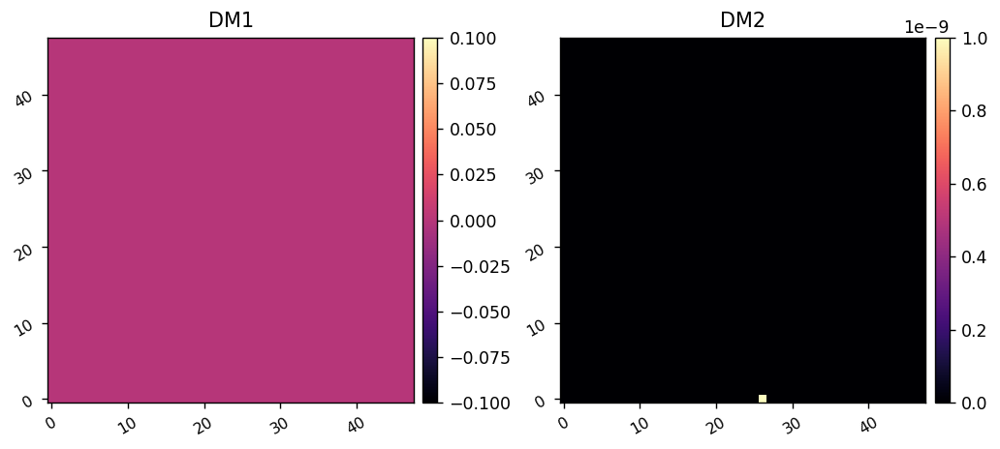

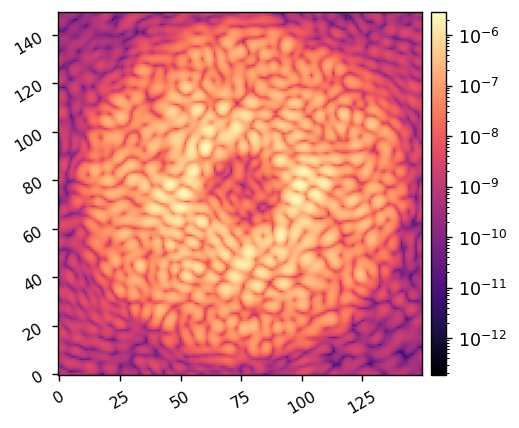

In [17]:
reload(cgi)
sys = cgi.CGI(cgi_mode='spc-wide', npsf=150,
              use_fpm=True,
              use_pupil_defocus=True, 
              polaxis=0,
              use_opds=True,
#               dm1_ref=dm1_flat, dm2_ref=dm2_flat,
             )
hlc.show_dms()

npsf = sys.npsf
Nact = sys.Nact

ref_psf = sys.snap()

misc.myimshow(ref_psf, lognorm=True)

# Create the dark-hole mask

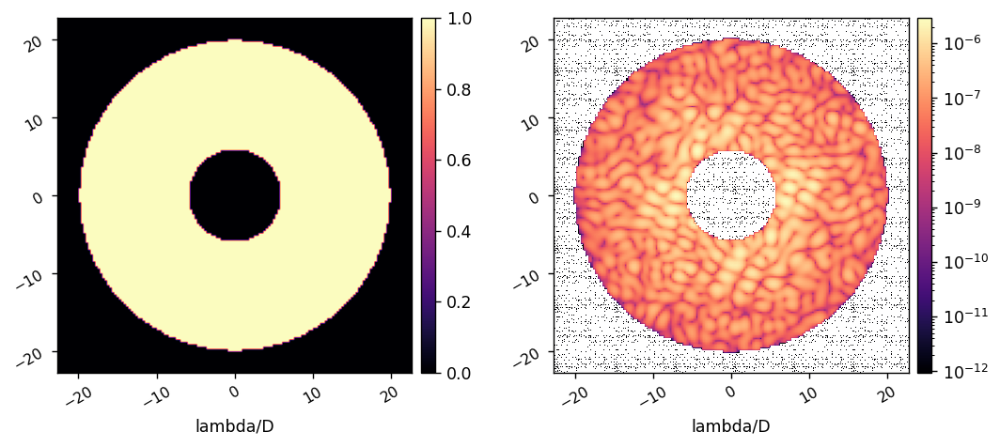

12328

In [18]:
xfp = np.linspace(-0.5, 0.5, npsf) * npsf * sys.psf_pixelscale_lamD
xf,yf = np.meshgrid(xfp,xfp)

edge = 2
iwa = 5.9
owa = 20
rot = 0

# Create the mask that is used to select which region to make dark.
dh_params = {
    'inner_radius' : iwa,
    'outer_radius' : owa,
    'edge_position' : edge,
#     'direction' : '+x',
    'rotation':rot,
    'full':True
}
dh_mask = utils.create_annular_focal_plane_mask(xf, yf, dh_params)

nmask = dh_mask.sum()

misc.myimshow2(dh_mask, ref_psf*dh_mask,  
               pxscl1=sys.psf_pixelscale_lamD, pxscl2=sys.psf_pixelscale_lamD,
               lognorm2=True)
nmask

In [19]:
reload(efc)

epsilon = 1e-9 # poke amplitudes (DM surface)
jac = efc.build_jacobian(sys, epsilon, dh_mask.flatten(), display=False)

Building Jacobian.
	Calculated response for mode 1/2304. Elapsed time=0.007 sec.
	Calculated response for mode 2/2304. Elapsed time=0.007 sec.
	Calculated response for mode 3/2304. Elapsed time=0.007 sec.
	Calculated response for mode 4/2304. Elapsed time=0.007 sec.
	Calculated response for mode 5/2304. Elapsed time=0.007 sec.
	Calculated response for mode 6/2304. Elapsed time=0.007 sec.
	Calculated response for mode 7/2304. Elapsed time=0.008 sec.
	Calculated response for mode 8/2304. Elapsed time=0.008 sec.
	Calculated response for mode 9/2304. Elapsed time=0.008 sec.
	Calculated response for mode 10/2304. Elapsed time=0.008 sec.
	Calculated response for mode 11/2304. Elapsed time=0.009 sec.
	Calculated response for mode 12/2304. Elapsed time=0.009 sec.
	Calculated response for mode 13/2304. Elapsed time=0.009 sec.
	Calculated response for mode 14/2304. Elapsed time=0.009 sec.
	Calculated response for mode 15/2304. Elapsed time=0.009 sec.
	Calculated response for mode 16/2304. Elapse

	Calculated response for mode 130/2304. Elapsed time=63.011 sec.
	Calculated response for mode 131/2304. Elapsed time=63.012 sec.
	Calculated response for mode 132/2304. Elapsed time=63.012 sec.
	Calculated response for mode 133/2304. Elapsed time=63.012 sec.
	Calculated response for mode 134/2304. Elapsed time=63.013 sec.
	Calculated response for mode 135/2304. Elapsed time=63.013 sec.
	Calculated response for mode 136/2304. Elapsed time=63.013 sec.
	Calculated response for mode 137/2304. Elapsed time=63.013 sec.
	Calculated response for mode 138/2304. Elapsed time=63.013 sec.
	Calculated response for mode 139/2304. Elapsed time=63.014 sec.
	Calculated response for mode 140/2304. Elapsed time=63.014 sec.
	Calculated response for mode 141/2304. Elapsed time=63.014 sec.
	Calculated response for mode 142/2304. Elapsed time=63.014 sec.
	Calculated response for mode 143/2304. Elapsed time=63.015 sec.
	Calculated response for mode 144/2304. Elapsed time=63.015 sec.
	Calculated response for 

	Calculated response for mode 256/2304. Elapsed time=151.098 sec.
	Calculated response for mode 257/2304. Elapsed time=152.585 sec.
	Calculated response for mode 258/2304. Elapsed time=154.071 sec.
	Calculated response for mode 259/2304. Elapsed time=155.556 sec.
	Calculated response for mode 260/2304. Elapsed time=157.044 sec.
	Calculated response for mode 261/2304. Elapsed time=158.527 sec.
	Calculated response for mode 262/2304. Elapsed time=160.013 sec.
	Calculated response for mode 263/2304. Elapsed time=161.500 sec.
	Calculated response for mode 264/2304. Elapsed time=162.985 sec.
	Calculated response for mode 265/2304. Elapsed time=164.473 sec.
	Calculated response for mode 266/2304. Elapsed time=165.965 sec.
	Calculated response for mode 267/2304. Elapsed time=167.452 sec.
	Calculated response for mode 268/2304. Elapsed time=168.939 sec.
	Calculated response for mode 269/2304. Elapsed time=170.420 sec.
	Calculated response for mode 270/2304. Elapsed time=171.908 sec.
	Calculate

	Calculated response for mode 391/2304. Elapsed time=286.379 sec.
	Calculated response for mode 392/2304. Elapsed time=293.470 sec.
	Calculated response for mode 393/2304. Elapsed time=294.952 sec.
	Calculated response for mode 394/2304. Elapsed time=296.435 sec.
	Calculated response for mode 395/2304. Elapsed time=297.911 sec.
	Calculated response for mode 396/2304. Elapsed time=303.938 sec.
	Calculated response for mode 397/2304. Elapsed time=305.420 sec.
	Calculated response for mode 398/2304. Elapsed time=306.897 sec.
	Calculated response for mode 399/2304. Elapsed time=308.379 sec.
	Calculated response for mode 400/2304. Elapsed time=309.857 sec.
	Calculated response for mode 401/2304. Elapsed time=311.334 sec.
	Calculated response for mode 402/2304. Elapsed time=312.818 sec.
	Calculated response for mode 403/2304. Elapsed time=314.296 sec.
	Calculated response for mode 404/2304. Elapsed time=315.778 sec.
	Calculated response for mode 405/2304. Elapsed time=317.264 sec.
	Calculate

	Calculated response for mode 516/2304. Elapsed time=457.395 sec.
	Calculated response for mode 517/2304. Elapsed time=458.880 sec.
	Calculated response for mode 518/2304. Elapsed time=460.370 sec.
	Calculated response for mode 519/2304. Elapsed time=461.857 sec.
	Calculated response for mode 520/2304. Elapsed time=463.353 sec.
	Calculated response for mode 521/2304. Elapsed time=464.843 sec.
	Calculated response for mode 522/2304. Elapsed time=466.334 sec.
	Calculated response for mode 523/2304. Elapsed time=467.829 sec.
	Calculated response for mode 524/2304. Elapsed time=469.319 sec.
	Calculated response for mode 525/2304. Elapsed time=469.320 sec.
	Calculated response for mode 526/2304. Elapsed time=469.320 sec.
	Calculated response for mode 527/2304. Elapsed time=469.320 sec.
	Calculated response for mode 528/2304. Elapsed time=469.320 sec.
	Calculated response for mode 529/2304. Elapsed time=469.320 sec.
	Calculated response for mode 530/2304. Elapsed time=469.321 sec.
	Calculate

	Calculated response for mode 641/2304. Elapsed time=613.025 sec.
	Calculated response for mode 642/2304. Elapsed time=614.516 sec.
	Calculated response for mode 643/2304. Elapsed time=616.008 sec.
	Calculated response for mode 644/2304. Elapsed time=617.502 sec.
	Calculated response for mode 645/2304. Elapsed time=618.995 sec.
	Calculated response for mode 646/2304. Elapsed time=620.488 sec.
	Calculated response for mode 647/2304. Elapsed time=621.973 sec.
	Calculated response for mode 648/2304. Elapsed time=623.460 sec.
	Calculated response for mode 649/2304. Elapsed time=624.949 sec.
	Calculated response for mode 650/2304. Elapsed time=626.434 sec.
	Calculated response for mode 651/2304. Elapsed time=627.923 sec.
	Calculated response for mode 652/2304. Elapsed time=629.417 sec.
	Calculated response for mode 653/2304. Elapsed time=630.910 sec.
	Calculated response for mode 654/2304. Elapsed time=632.399 sec.
	Calculated response for mode 655/2304. Elapsed time=633.885 sec.
	Calculate

	Calculated response for mode 766/2304. Elapsed time=784.093 sec.
	Calculated response for mode 767/2304. Elapsed time=784.094 sec.
	Calculated response for mode 768/2304. Elapsed time=784.094 sec.
	Calculated response for mode 769/2304. Elapsed time=784.094 sec.
	Calculated response for mode 770/2304. Elapsed time=785.545 sec.
	Calculated response for mode 771/2304. Elapsed time=786.999 sec.
	Calculated response for mode 772/2304. Elapsed time=788.449 sec.
	Calculated response for mode 773/2304. Elapsed time=789.904 sec.
	Calculated response for mode 774/2304. Elapsed time=791.357 sec.
	Calculated response for mode 775/2304. Elapsed time=792.810 sec.
	Calculated response for mode 776/2304. Elapsed time=794.259 sec.
	Calculated response for mode 777/2304. Elapsed time=795.716 sec.
	Calculated response for mode 778/2304. Elapsed time=797.171 sec.
	Calculated response for mode 779/2304. Elapsed time=798.628 sec.
	Calculated response for mode 780/2304. Elapsed time=800.085 sec.
	Calculate

	Calculated response for mode 891/2304. Elapsed time=956.822 sec.
	Calculated response for mode 892/2304. Elapsed time=958.306 sec.
	Calculated response for mode 893/2304. Elapsed time=959.786 sec.
	Calculated response for mode 894/2304. Elapsed time=961.272 sec.
	Calculated response for mode 895/2304. Elapsed time=962.760 sec.
	Calculated response for mode 896/2304. Elapsed time=964.225 sec.
	Calculated response for mode 897/2304. Elapsed time=965.707 sec.
	Calculated response for mode 898/2304. Elapsed time=967.192 sec.
	Calculated response for mode 899/2304. Elapsed time=968.671 sec.
	Calculated response for mode 900/2304. Elapsed time=970.152 sec.
	Calculated response for mode 901/2304. Elapsed time=971.643 sec.
	Calculated response for mode 902/2304. Elapsed time=973.135 sec.
	Calculated response for mode 903/2304. Elapsed time=974.622 sec.
	Calculated response for mode 904/2304. Elapsed time=976.365 sec.
	Calculated response for mode 905/2304. Elapsed time=977.839 sec.
	Calculate

	Calculated response for mode 1014/2304. Elapsed time=1130.553 sec.
	Calculated response for mode 1015/2304. Elapsed time=1132.005 sec.
	Calculated response for mode 1016/2304. Elapsed time=1133.454 sec.
	Calculated response for mode 1017/2304. Elapsed time=1134.905 sec.
	Calculated response for mode 1018/2304. Elapsed time=1136.354 sec.
	Calculated response for mode 1019/2304. Elapsed time=1137.802 sec.
	Calculated response for mode 1020/2304. Elapsed time=1139.250 sec.
	Calculated response for mode 1021/2304. Elapsed time=1140.701 sec.
	Calculated response for mode 1022/2304. Elapsed time=1142.149 sec.
	Calculated response for mode 1023/2304. Elapsed time=1143.597 sec.
	Calculated response for mode 1024/2304. Elapsed time=1145.048 sec.
	Calculated response for mode 1025/2304. Elapsed time=1146.496 sec.
	Calculated response for mode 1026/2304. Elapsed time=1147.948 sec.
	Calculated response for mode 1027/2304. Elapsed time=1149.398 sec.
	Calculated response for mode 1028/2304. Elapsed

	Calculated response for mode 1135/2304. Elapsed time=1307.275 sec.
	Calculated response for mode 1136/2304. Elapsed time=1308.765 sec.
	Calculated response for mode 1137/2304. Elapsed time=1310.254 sec.
	Calculated response for mode 1138/2304. Elapsed time=1311.738 sec.
	Calculated response for mode 1139/2304. Elapsed time=1313.225 sec.
	Calculated response for mode 1140/2304. Elapsed time=1314.711 sec.
	Calculated response for mode 1141/2304. Elapsed time=1316.199 sec.
	Calculated response for mode 1142/2304. Elapsed time=1317.687 sec.
	Calculated response for mode 1143/2304. Elapsed time=1319.178 sec.
	Calculated response for mode 1144/2304. Elapsed time=1320.660 sec.
	Calculated response for mode 1145/2304. Elapsed time=1322.145 sec.
	Calculated response for mode 1146/2304. Elapsed time=1323.623 sec.
	Calculated response for mode 1147/2304. Elapsed time=1325.103 sec.
	Calculated response for mode 1148/2304. Elapsed time=1326.588 sec.
	Calculated response for mode 1149/2304. Elapsed

	Calculated response for mode 1256/2304. Elapsed time=1487.298 sec.
	Calculated response for mode 1257/2304. Elapsed time=1488.785 sec.
	Calculated response for mode 1258/2304. Elapsed time=1490.271 sec.
	Calculated response for mode 1259/2304. Elapsed time=1491.758 sec.
	Calculated response for mode 1260/2304. Elapsed time=1493.243 sec.
	Calculated response for mode 1261/2304. Elapsed time=1494.725 sec.
	Calculated response for mode 1262/2304. Elapsed time=1496.213 sec.
	Calculated response for mode 1263/2304. Elapsed time=1497.695 sec.
	Calculated response for mode 1264/2304. Elapsed time=1499.187 sec.
	Calculated response for mode 1265/2304. Elapsed time=1500.679 sec.
	Calculated response for mode 1266/2304. Elapsed time=1502.169 sec.
	Calculated response for mode 1267/2304. Elapsed time=1503.656 sec.
	Calculated response for mode 1268/2304. Elapsed time=1505.142 sec.
	Calculated response for mode 1269/2304. Elapsed time=1506.630 sec.
	Calculated response for mode 1270/2304. Elapsed

	Calculated response for mode 1377/2304. Elapsed time=1662.878 sec.
	Calculated response for mode 1378/2304. Elapsed time=1664.362 sec.
	Calculated response for mode 1379/2304. Elapsed time=1665.848 sec.
	Calculated response for mode 1380/2304. Elapsed time=1667.330 sec.
	Calculated response for mode 1381/2304. Elapsed time=1668.813 sec.
	Calculated response for mode 1382/2304. Elapsed time=1670.522 sec.
	Calculated response for mode 1383/2304. Elapsed time=1672.000 sec.
	Calculated response for mode 1384/2304. Elapsed time=1673.485 sec.
	Calculated response for mode 1385/2304. Elapsed time=1674.960 sec.
	Calculated response for mode 1386/2304. Elapsed time=1676.436 sec.
	Calculated response for mode 1387/2304. Elapsed time=1677.923 sec.
	Calculated response for mode 1388/2304. Elapsed time=1679.400 sec.
	Calculated response for mode 1389/2304. Elapsed time=1680.876 sec.
	Calculated response for mode 1390/2304. Elapsed time=1682.354 sec.
	Calculated response for mode 1391/2304. Elapsed

	Calculated response for mode 1498/2304. Elapsed time=1834.022 sec.
	Calculated response for mode 1499/2304. Elapsed time=1835.504 sec.
	Calculated response for mode 1500/2304. Elapsed time=1836.991 sec.
	Calculated response for mode 1501/2304. Elapsed time=1838.472 sec.
	Calculated response for mode 1502/2304. Elapsed time=1839.959 sec.
	Calculated response for mode 1503/2304. Elapsed time=1841.413 sec.
	Calculated response for mode 1504/2304. Elapsed time=1842.862 sec.
	Calculated response for mode 1505/2304. Elapsed time=1844.311 sec.
	Calculated response for mode 1506/2304. Elapsed time=1845.761 sec.
	Calculated response for mode 1507/2304. Elapsed time=1847.210 sec.
	Calculated response for mode 1508/2304. Elapsed time=1848.659 sec.
	Calculated response for mode 1509/2304. Elapsed time=1850.108 sec.
	Calculated response for mode 1510/2304. Elapsed time=1851.557 sec.
	Calculated response for mode 1511/2304. Elapsed time=1853.006 sec.
	Calculated response for mode 1512/2304. Elapsed

	Calculated response for mode 1619/2304. Elapsed time=2000.507 sec.
	Calculated response for mode 1620/2304. Elapsed time=2001.990 sec.
	Calculated response for mode 1621/2304. Elapsed time=2003.475 sec.
	Calculated response for mode 1622/2304. Elapsed time=2004.963 sec.
	Calculated response for mode 1623/2304. Elapsed time=2006.452 sec.
	Calculated response for mode 1624/2304. Elapsed time=2007.939 sec.
	Calculated response for mode 1625/2304. Elapsed time=2009.422 sec.
	Calculated response for mode 1626/2304. Elapsed time=2010.911 sec.
	Calculated response for mode 1627/2304. Elapsed time=2012.395 sec.
	Calculated response for mode 1628/2304. Elapsed time=2013.886 sec.
	Calculated response for mode 1629/2304. Elapsed time=2015.372 sec.
	Calculated response for mode 1630/2304. Elapsed time=2016.856 sec.
	Calculated response for mode 1631/2304. Elapsed time=2016.856 sec.
	Calculated response for mode 1632/2304. Elapsed time=2016.856 sec.
	Calculated response for mode 1633/2304. Elapsed

	Calculated response for mode 1740/2304. Elapsed time=2153.824 sec.
	Calculated response for mode 1741/2304. Elapsed time=2155.302 sec.
	Calculated response for mode 1742/2304. Elapsed time=2156.783 sec.
	Calculated response for mode 1743/2304. Elapsed time=2158.261 sec.
	Calculated response for mode 1744/2304. Elapsed time=2159.743 sec.
	Calculated response for mode 1745/2304. Elapsed time=2161.224 sec.
	Calculated response for mode 1746/2304. Elapsed time=2162.704 sec.
	Calculated response for mode 1747/2304. Elapsed time=2164.188 sec.
	Calculated response for mode 1748/2304. Elapsed time=2165.674 sec.
	Calculated response for mode 1749/2304. Elapsed time=2167.151 sec.
	Calculated response for mode 1750/2304. Elapsed time=2168.637 sec.
	Calculated response for mode 1751/2304. Elapsed time=2170.120 sec.
	Calculated response for mode 1752/2304. Elapsed time=2171.603 sec.
	Calculated response for mode 1753/2304. Elapsed time=2173.089 sec.
	Calculated response for mode 1754/2304. Elapsed

	Calculated response for mode 1861/2304. Elapsed time=2308.764 sec.
	Calculated response for mode 1862/2304. Elapsed time=2310.242 sec.
	Calculated response for mode 1863/2304. Elapsed time=2311.729 sec.
	Calculated response for mode 1864/2304. Elapsed time=2313.206 sec.
	Calculated response for mode 1865/2304. Elapsed time=2314.682 sec.
	Calculated response for mode 1866/2304. Elapsed time=2316.165 sec.
	Calculated response for mode 1867/2304. Elapsed time=2317.653 sec.
	Calculated response for mode 1868/2304. Elapsed time=2317.654 sec.
	Calculated response for mode 1869/2304. Elapsed time=2317.654 sec.
	Calculated response for mode 1870/2304. Elapsed time=2317.654 sec.
	Calculated response for mode 1871/2304. Elapsed time=2317.654 sec.
	Calculated response for mode 1872/2304. Elapsed time=2317.654 sec.
	Calculated response for mode 1873/2304. Elapsed time=2317.655 sec.
	Calculated response for mode 1874/2304. Elapsed time=2317.655 sec.
	Calculated response for mode 1875/2304. Elapsed

	Calculated response for mode 1982/2304. Elapsed time=2429.745 sec.
	Calculated response for mode 1983/2304. Elapsed time=2431.232 sec.
	Calculated response for mode 1984/2304. Elapsed time=2432.720 sec.
	Calculated response for mode 1985/2304. Elapsed time=2434.200 sec.
	Calculated response for mode 1986/2304. Elapsed time=2435.696 sec.
	Calculated response for mode 1987/2304. Elapsed time=2437.183 sec.
	Calculated response for mode 1988/2304. Elapsed time=2438.672 sec.
	Calculated response for mode 1989/2304. Elapsed time=2440.157 sec.
	Calculated response for mode 1990/2304. Elapsed time=2441.647 sec.
	Calculated response for mode 1991/2304. Elapsed time=2443.134 sec.
	Calculated response for mode 1992/2304. Elapsed time=2444.622 sec.
	Calculated response for mode 1993/2304. Elapsed time=2446.112 sec.
	Calculated response for mode 1994/2304. Elapsed time=2447.838 sec.
	Calculated response for mode 1995/2304. Elapsed time=2449.327 sec.
	Calculated response for mode 1996/2304. Elapsed

	Calculated response for mode 2125/2304. Elapsed time=2556.416 sec.
	Calculated response for mode 2126/2304. Elapsed time=2557.900 sec.
	Calculated response for mode 2127/2304. Elapsed time=2559.386 sec.
	Calculated response for mode 2128/2304. Elapsed time=2560.873 sec.
	Calculated response for mode 2129/2304. Elapsed time=2562.352 sec.
	Calculated response for mode 2130/2304. Elapsed time=2563.835 sec.
	Calculated response for mode 2131/2304. Elapsed time=2565.318 sec.
	Calculated response for mode 2132/2304. Elapsed time=2566.802 sec.
	Calculated response for mode 2133/2304. Elapsed time=2568.281 sec.
	Calculated response for mode 2134/2304. Elapsed time=2569.772 sec.
	Calculated response for mode 2135/2304. Elapsed time=2571.255 sec.
	Calculated response for mode 2136/2304. Elapsed time=2572.740 sec.
	Calculated response for mode 2137/2304. Elapsed time=2574.224 sec.
	Calculated response for mode 2138/2304. Elapsed time=2575.708 sec.
	Calculated response for mode 2139/2304. Elapsed

	Calculated response for mode 2278/2304. Elapsed time=2645.724 sec.
	Calculated response for mode 2279/2304. Elapsed time=2647.213 sec.
	Calculated response for mode 2280/2304. Elapsed time=2648.696 sec.
	Calculated response for mode 2281/2304. Elapsed time=2650.178 sec.
	Calculated response for mode 2282/2304. Elapsed time=2651.666 sec.
	Calculated response for mode 2283/2304. Elapsed time=2653.155 sec.
	Calculated response for mode 2284/2304. Elapsed time=2653.156 sec.
	Calculated response for mode 2285/2304. Elapsed time=2653.156 sec.
	Calculated response for mode 2286/2304. Elapsed time=2653.156 sec.
	Calculated response for mode 2287/2304. Elapsed time=2653.156 sec.
	Calculated response for mode 2288/2304. Elapsed time=2653.156 sec.
	Calculated response for mode 2289/2304. Elapsed time=2653.157 sec.
	Calculated response for mode 2290/2304. Elapsed time=2653.157 sec.
	Calculated response for mode 2291/2304. Elapsed time=2653.157 sec.
	Calculated response for mode 2292/2304. Elapsed

In [20]:
jac_dir = Path('/groups/douglase/kians-data-files/roman-cgi-iefc-data/jacobians')
fname = 'spc_wide_5.9to20_opds_2dm'

In [22]:
misc.save_pickle(jac_dir/fname, jac, quiet=False)

Saved data to:  /groups/douglase/kians-data-files/roman-cgi-iefc-data/jacobians/spc_wide_5.9to20_opds_2dm


In [23]:
jac = misc.load_pickle(jac_dir/fname)
jac.shape, jac[:,:Nact**2].shape, jac[:,Nact**2:].shape

((24656, 4608), (24656, 2304), (24656, 2304))

# Generate probes and test PWP
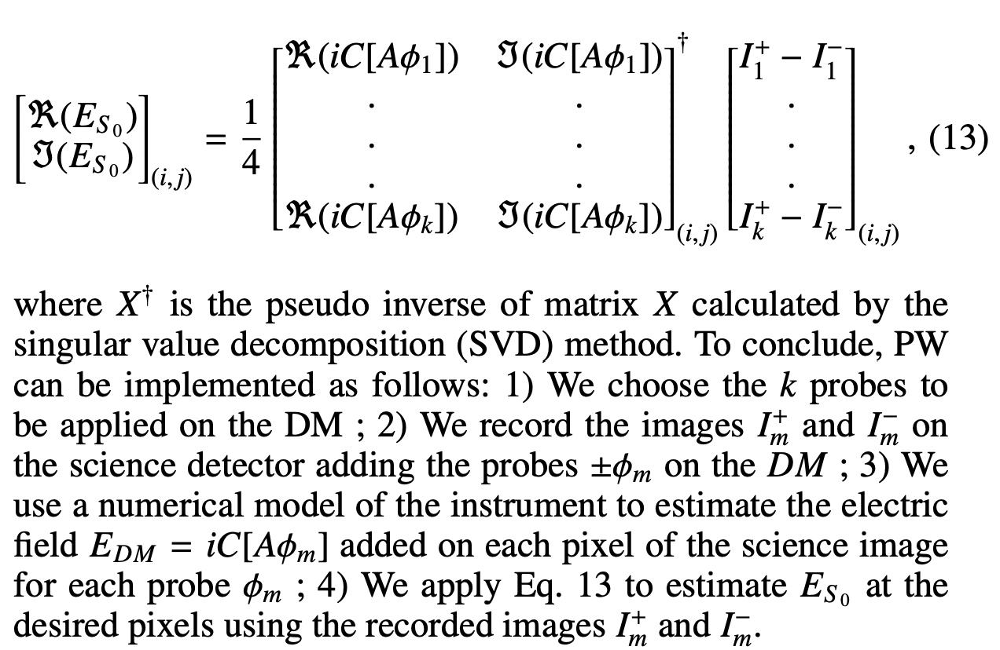

Generating probe with amplitude=2.063e-08, radius=12.0, phase=0.000, offset=(8.0,8.0), with discontinuity along x axis.
Generating probe with amplitude=2.063e-08, radius=12.0, phase=1.571, offset=(8.0,8.0), with discontinuity along y axis.


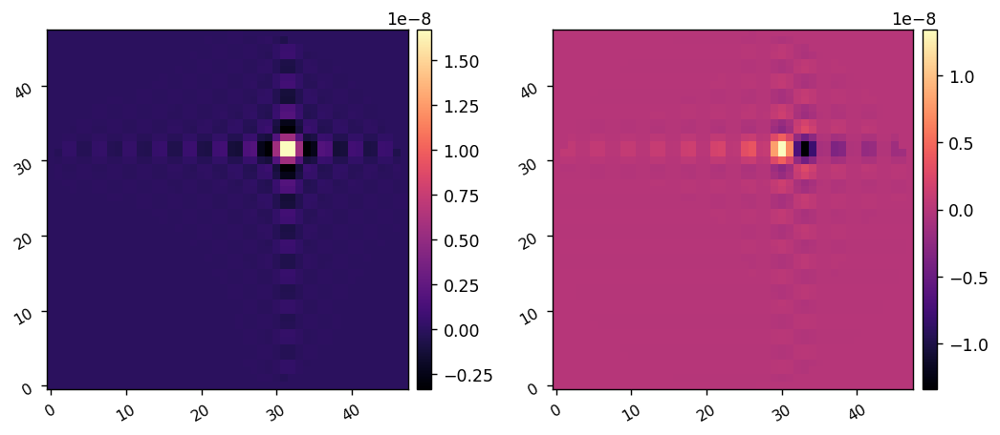

In [24]:
reload(efc)

Npairs = 2
probe_amp = 0.025*hlc.wavelength_c.value
probe_radius = 12
probe_offset = (8,8)

probes = efc.create_sinc_probes(Npairs, Nact, hlc.dm_mask, probe_amp, probe_radius, probe_offset, display=True)

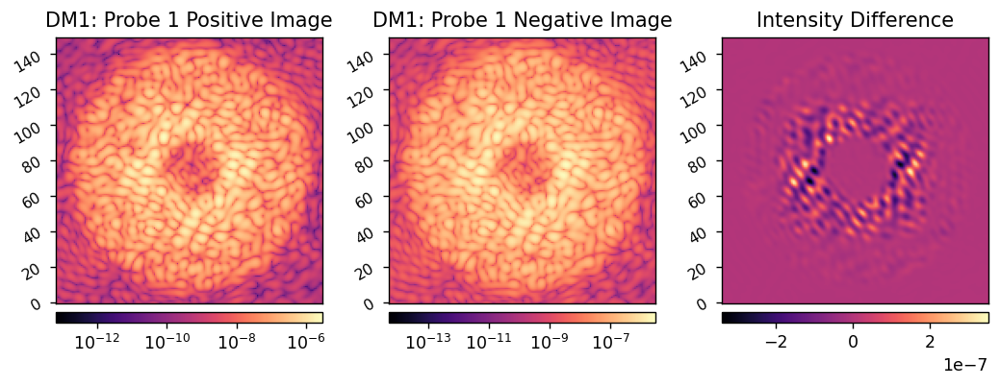

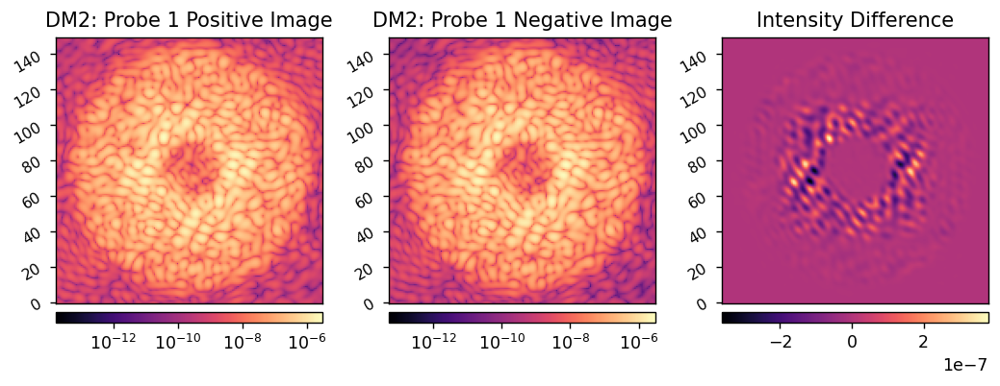

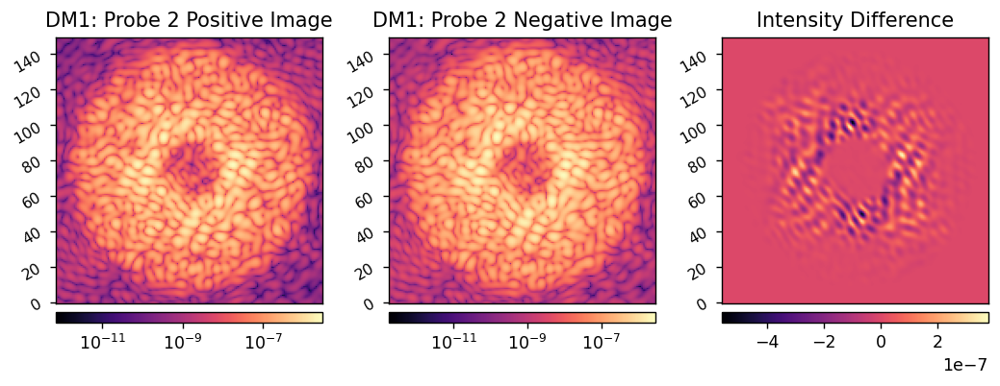

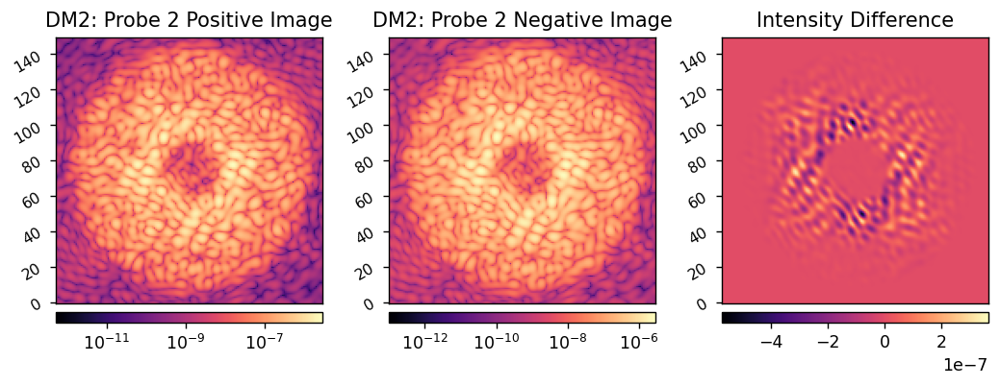

(2, 12328)


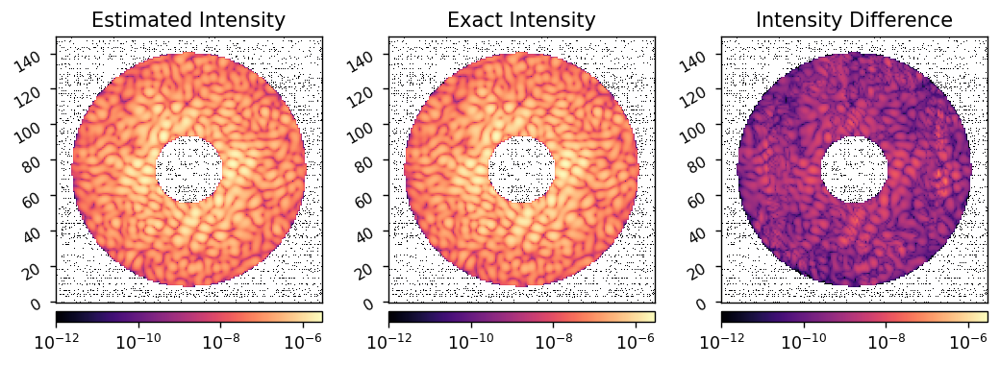

(1.7147827423904377e-07, 1.1647499008270424e-09)

In [25]:
reload(efc)

hlc.reset_dms()
E_est = efc.run_pwp(sys, probes, jac, dh_mask, reg_cond=1e-3, use_noise=False, display=True)
diff = abs(ref_psf*dh_mask - np.abs(E_est)**2)

vmin = 1e-12
vmax = ref_psf.max()
misc.myimshow3(np.abs(E_est)**2, 
               ref_psf*dh_mask, diff,
               'Estimated Intensity', 'Exact Intensity', 'Intensity Difference',
               lognorm1=True, lognorm2=True, lognorm3=True,
               vmin1=vmin, vmin2=vmin, vmin3=vmin,
               vmax1=vmax, vmax2=vmax, vmax3=vmax,
              )


np.mean(ref_psf[dh_mask]), np.mean(diff[dh_mask])

# Invert the Jacobian to get the control matrix

In [50]:
reload(efc)
rcond = 5e-2

efc_matrix = utils.TikhonovInverse(jac, rcond)
efc_matrix.shape

(4608, 2296)

In [26]:
import hcipy
rcond = 5e-3
efc_matrix = hcipy.inverse_tikhonov(jac, rcond)
efc_matrix.shape


(4608, 24656)

# Run EFC with perfect model

Beginning closed-loop EFC simulation.
	Running iteration 1/40.


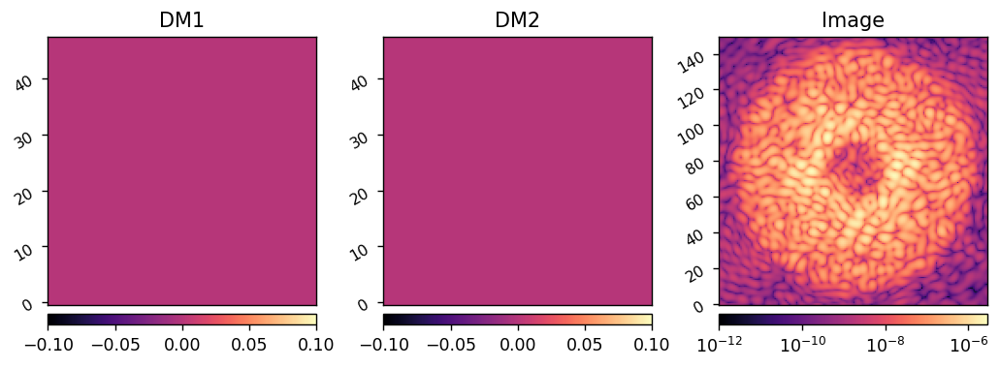

	Running iteration 2/40.


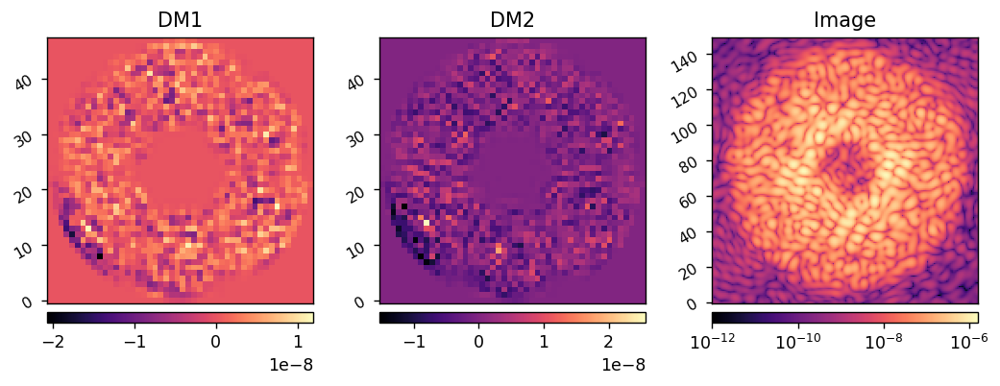

	Running iteration 3/40.


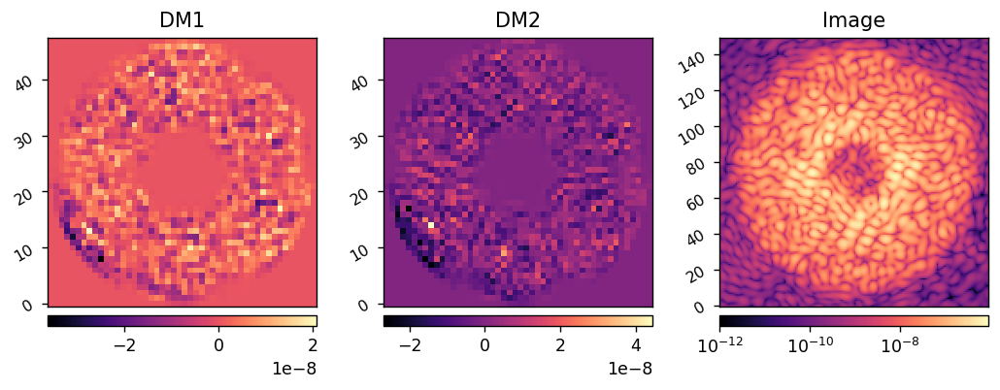

	Running iteration 4/40.


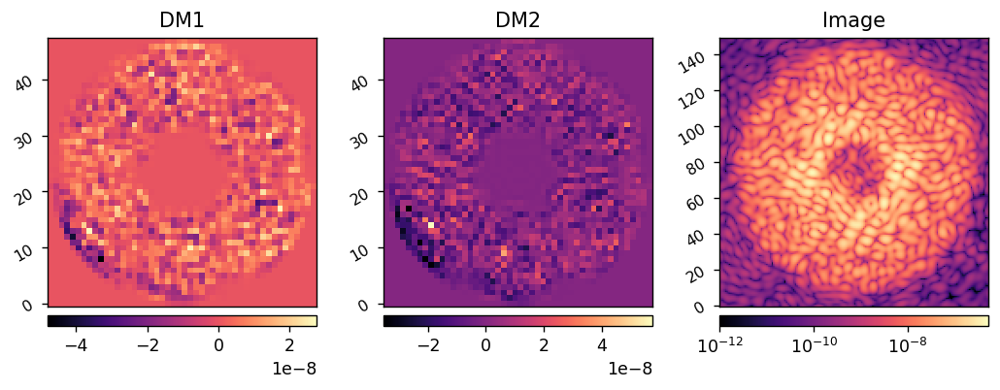

	Running iteration 5/40.


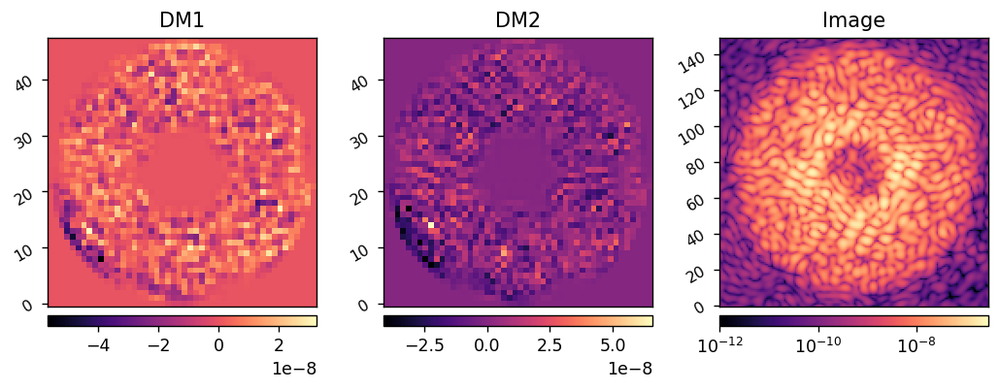

	Running iteration 6/40.


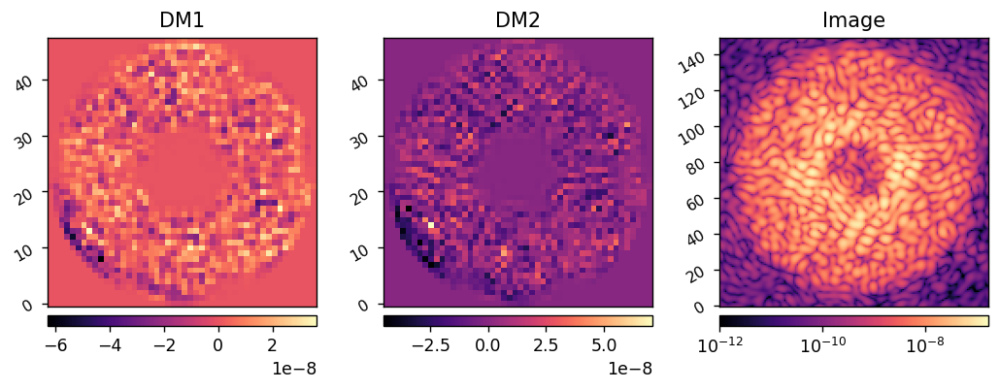

	Running iteration 7/40.


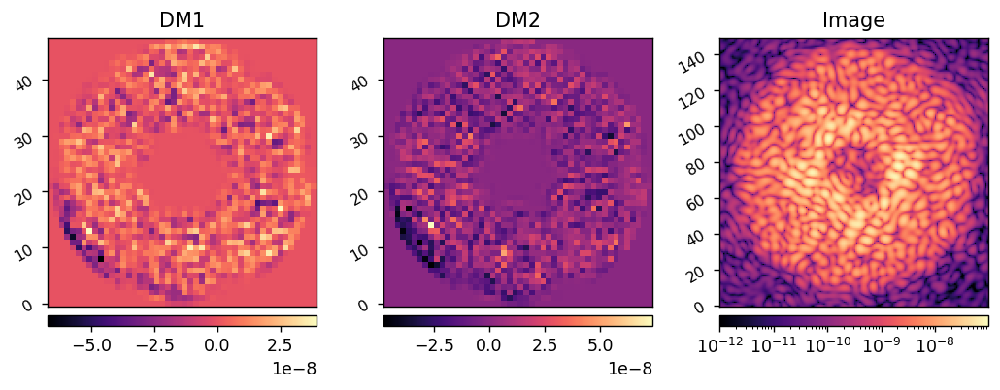

	Running iteration 8/40.


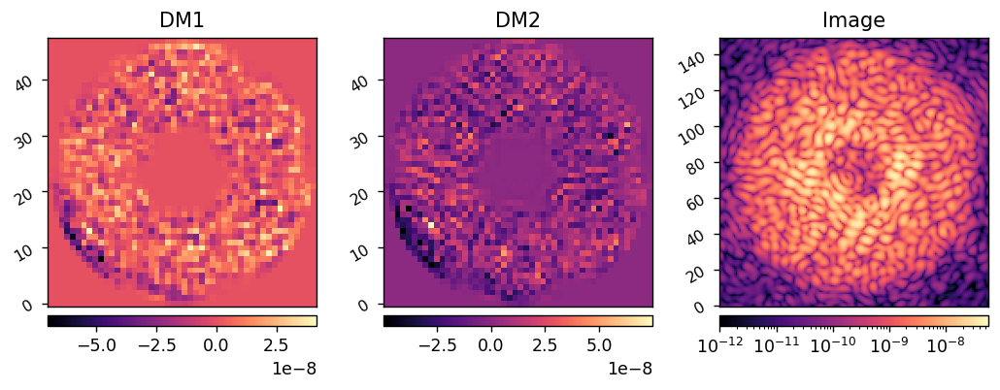

	Running iteration 9/40.


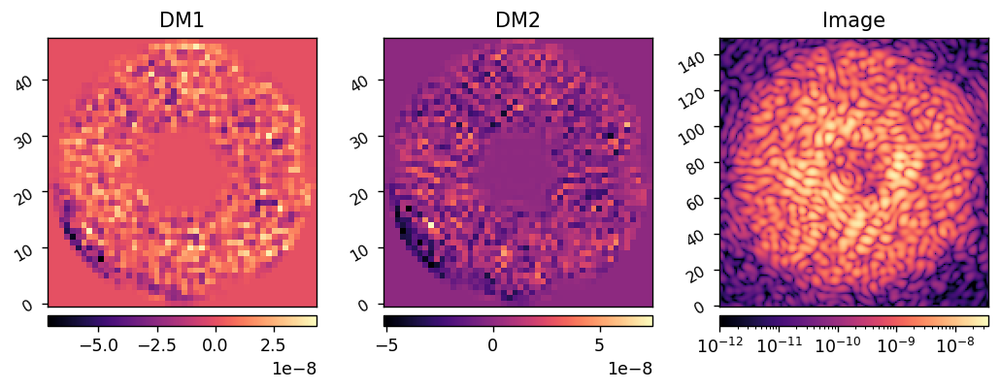

	Running iteration 10/40.


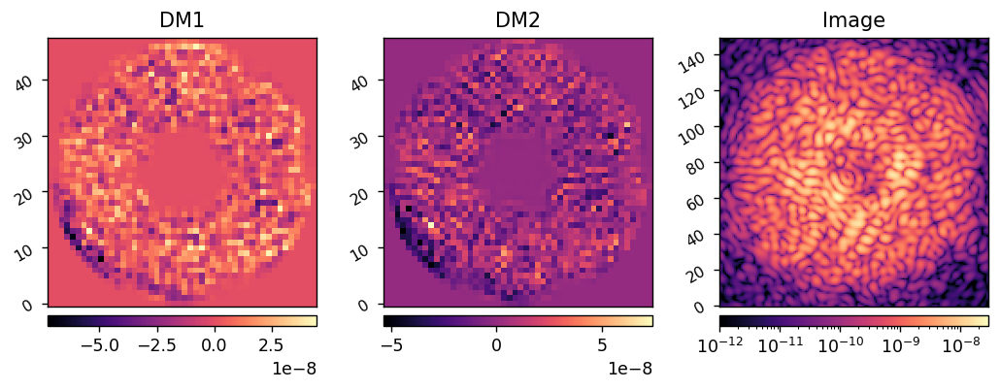

	Running iteration 11/40.


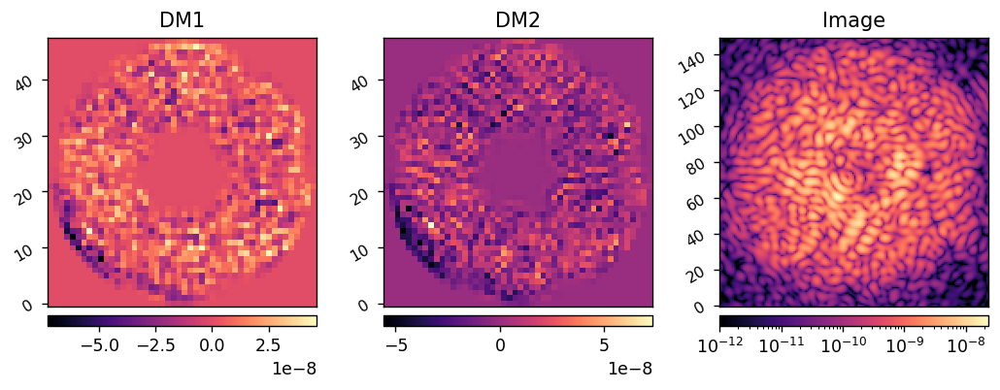

	Running iteration 12/40.


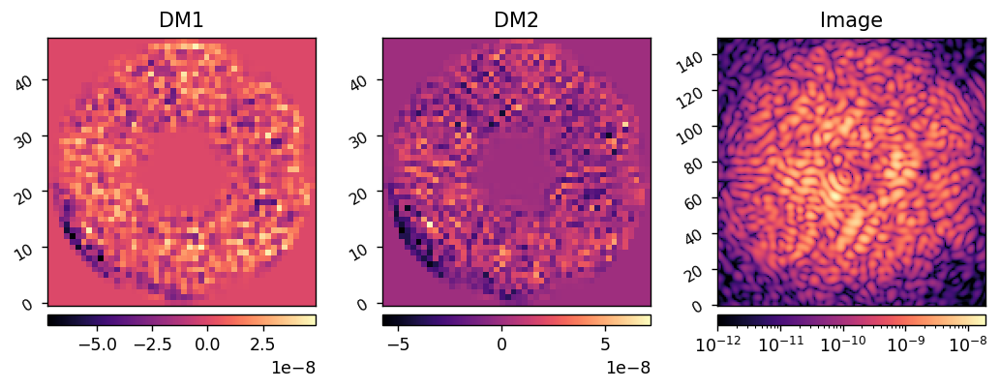

	Running iteration 13/40.


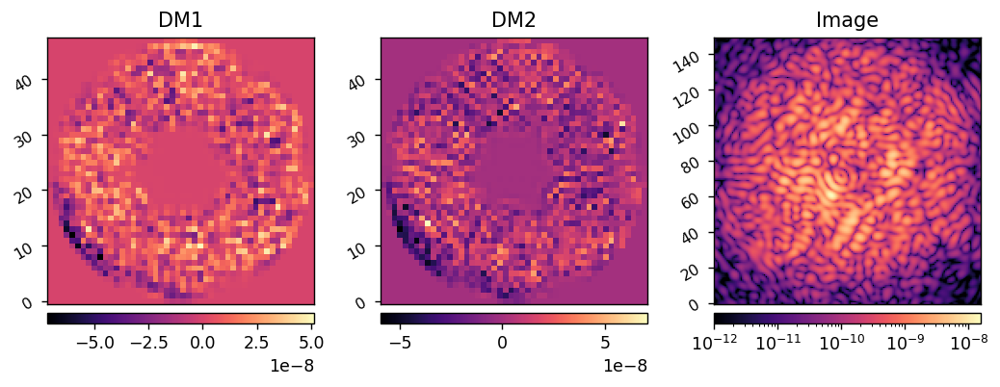

	Running iteration 14/40.


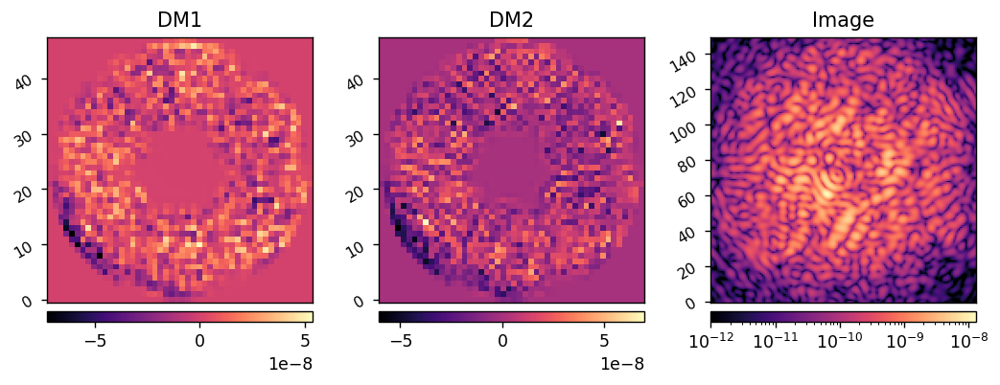

	Running iteration 15/40.


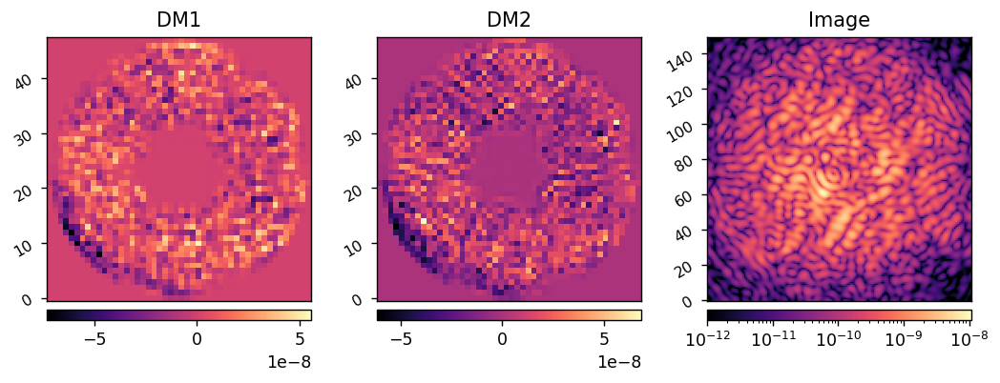

	Running iteration 16/40.


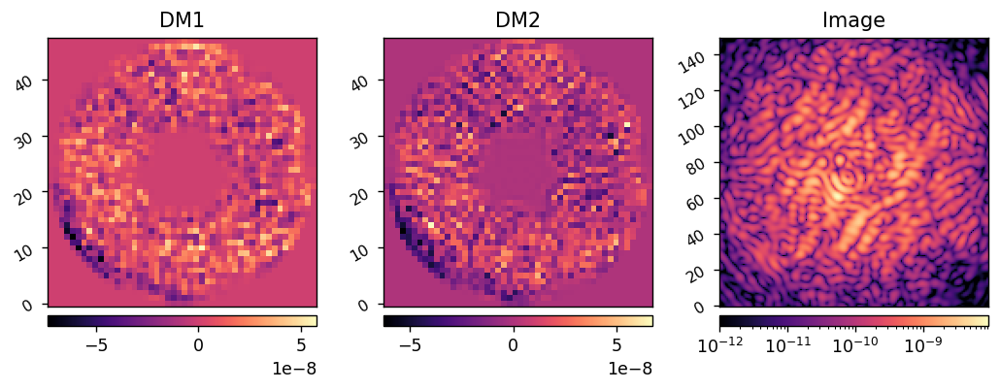

	Running iteration 17/40.


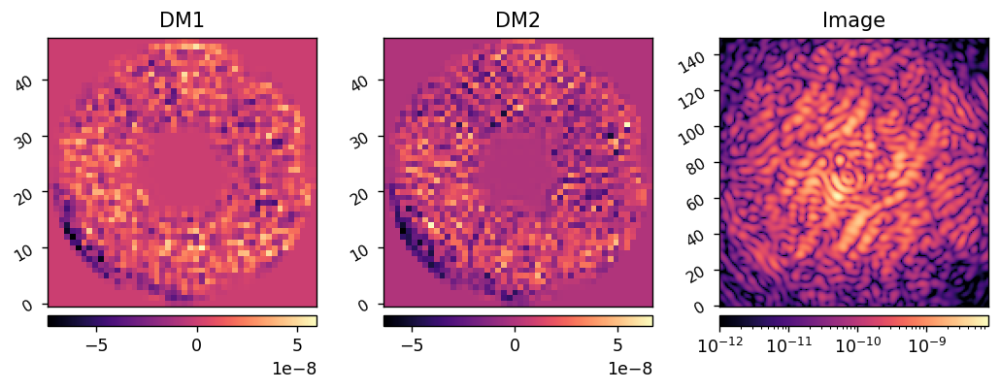

	Running iteration 18/40.


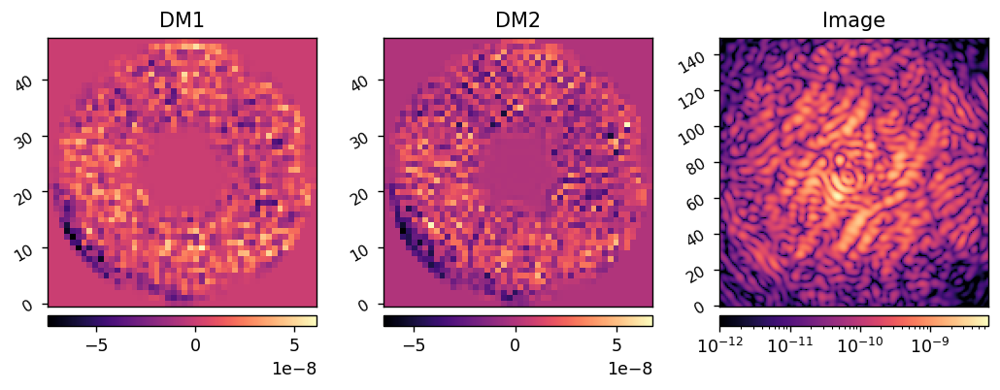

	Running iteration 19/40.


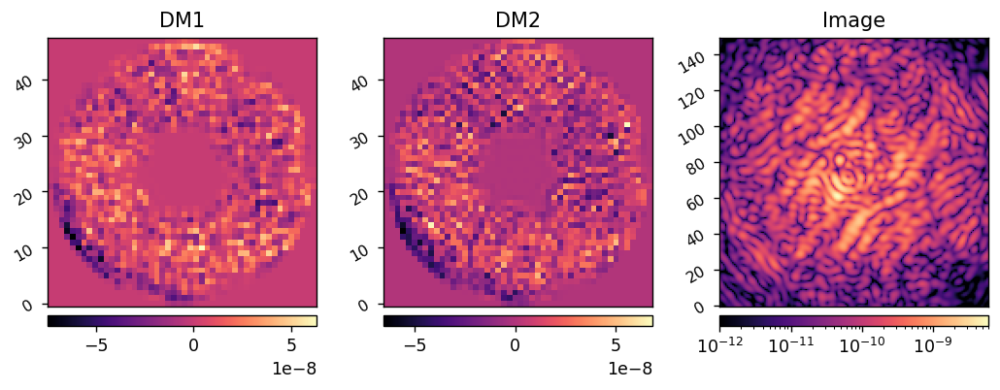

	Running iteration 20/40.


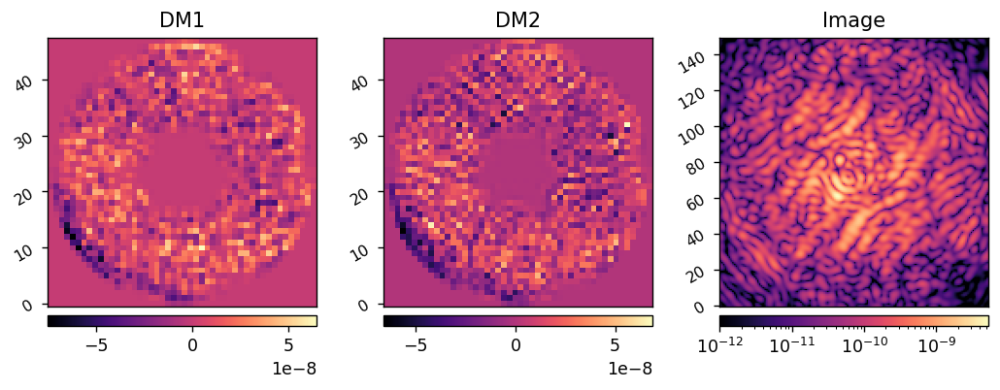

	Running iteration 21/40.


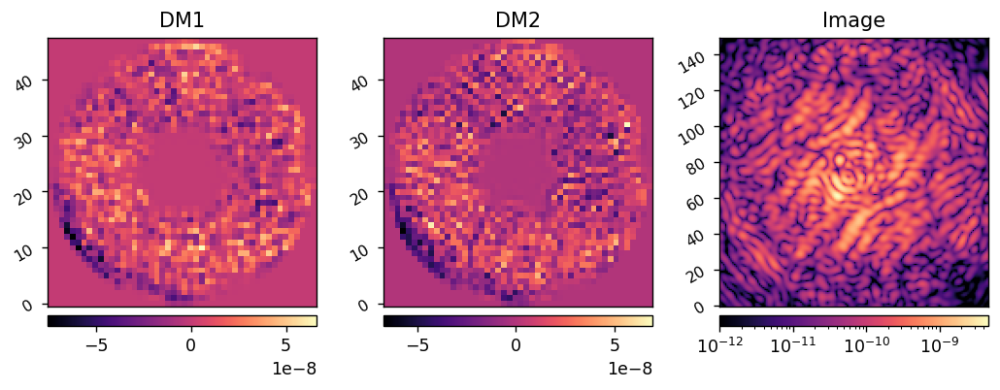

	Running iteration 22/40.


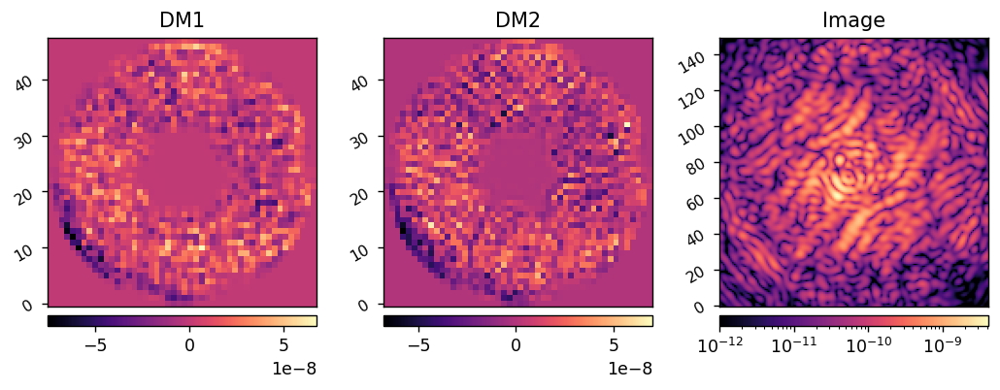

	Running iteration 23/40.


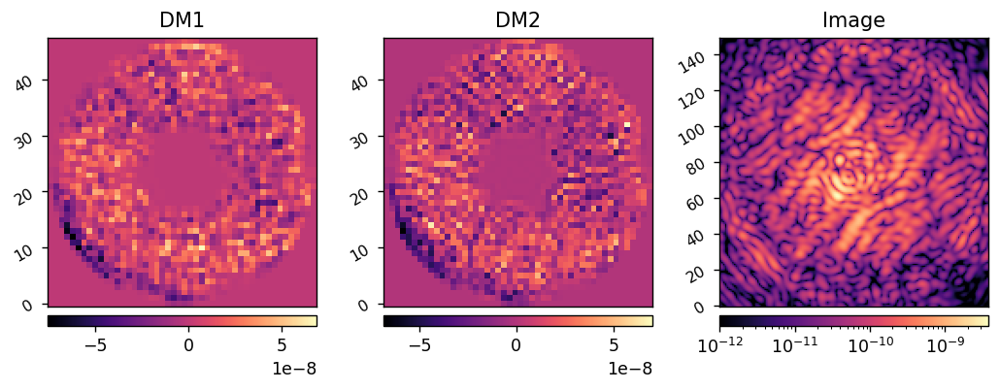

	Running iteration 24/40.


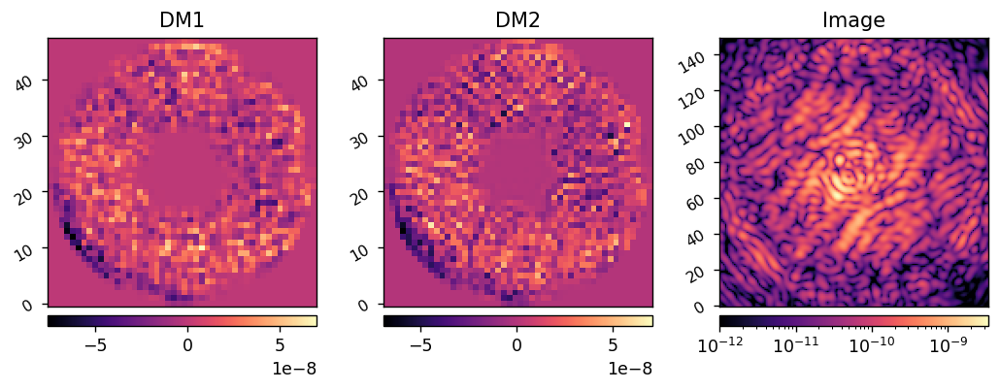

	Running iteration 25/40.


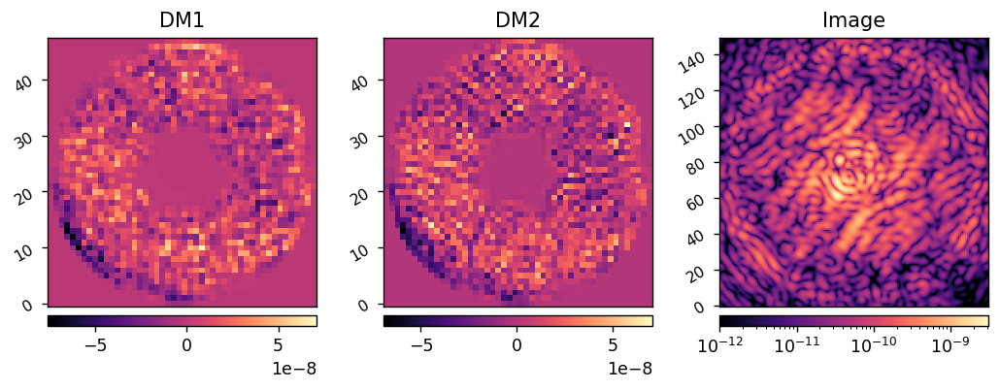

	Running iteration 26/40.


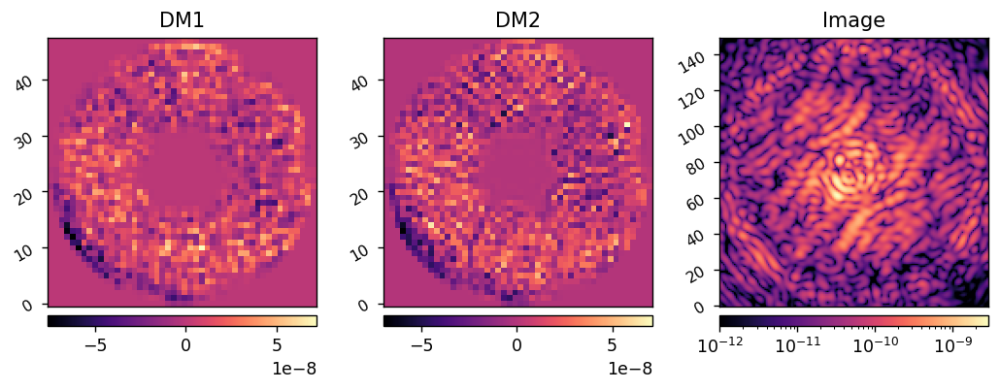

	Running iteration 27/40.


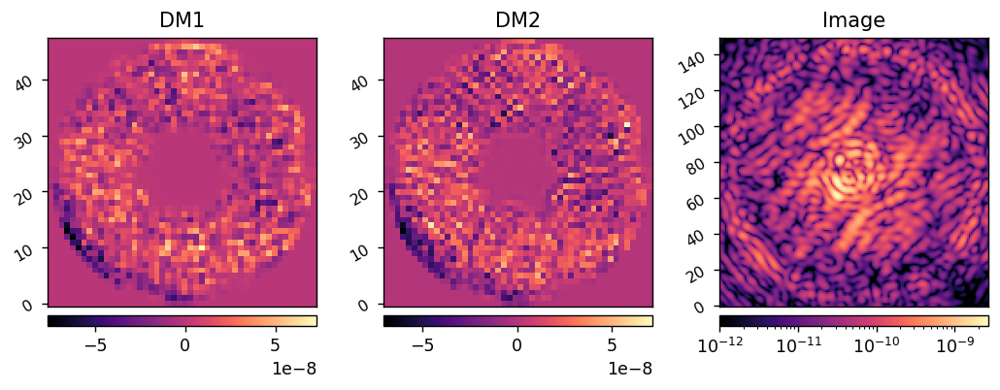

	Running iteration 28/40.


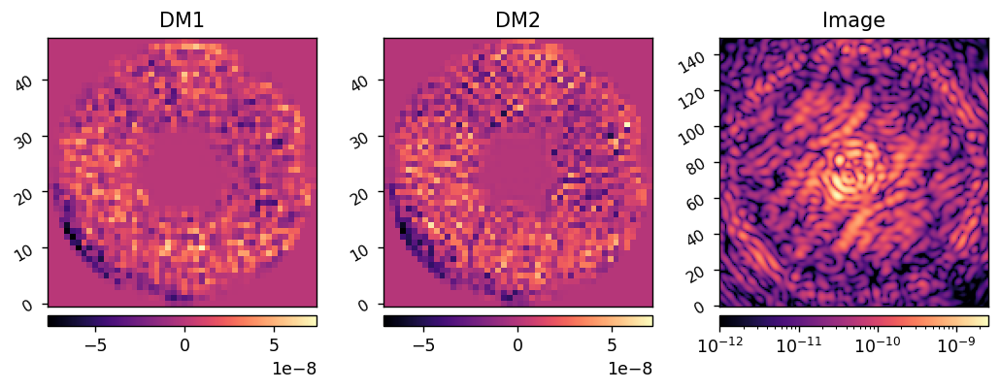

	Running iteration 29/40.


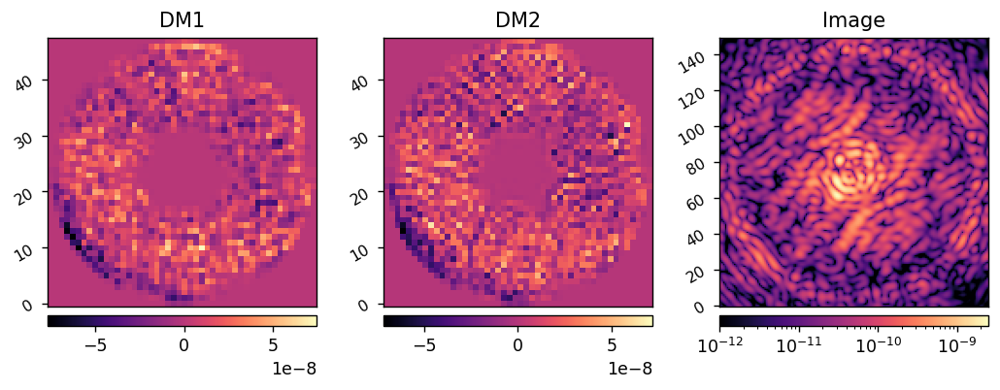

	Running iteration 30/40.


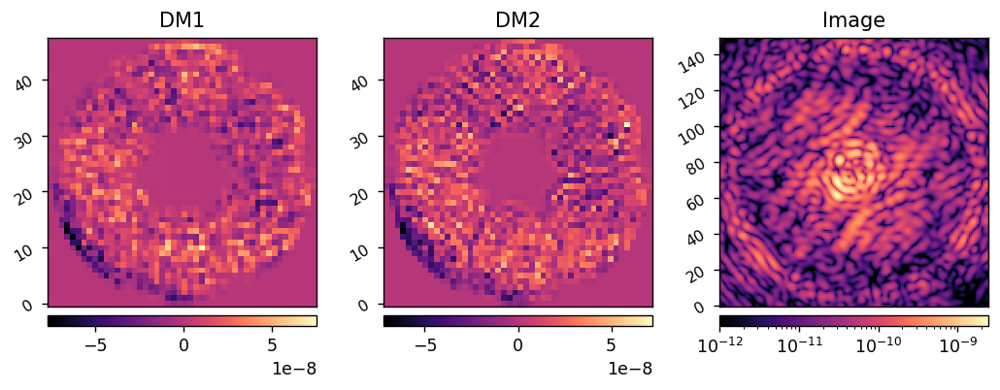

	Running iteration 31/40.


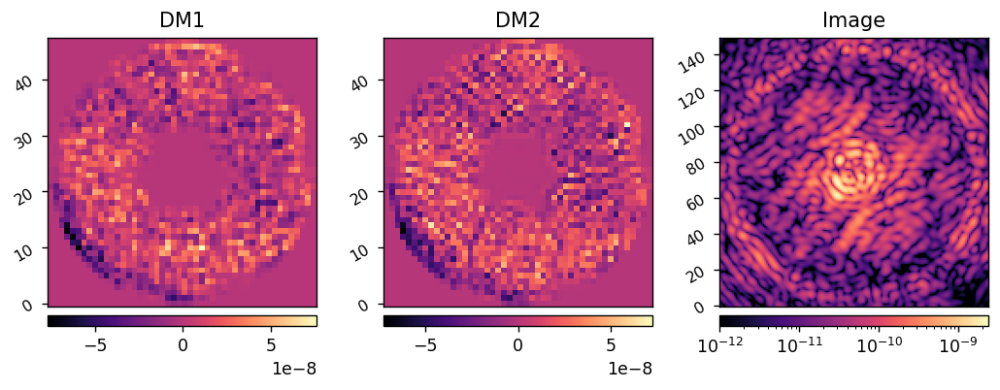

	Running iteration 32/40.


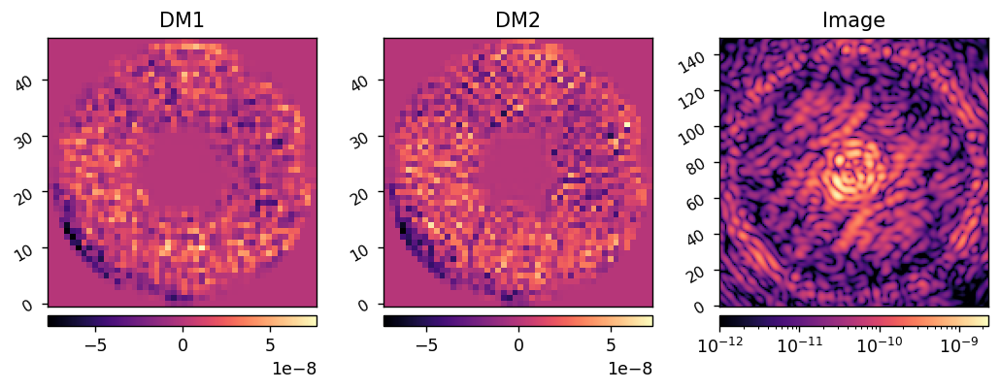

	Running iteration 33/40.


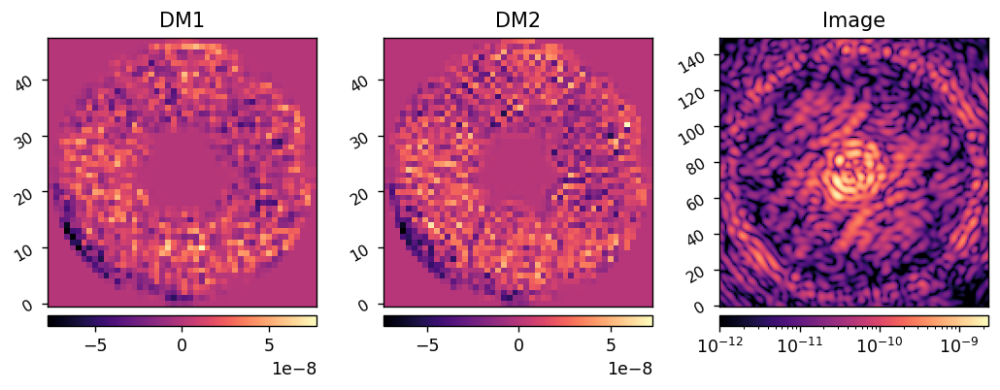

	Running iteration 34/40.


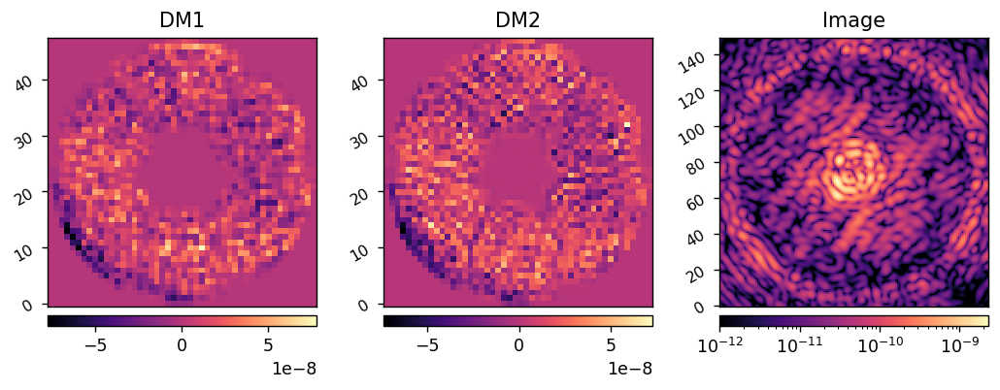

	Running iteration 35/40.


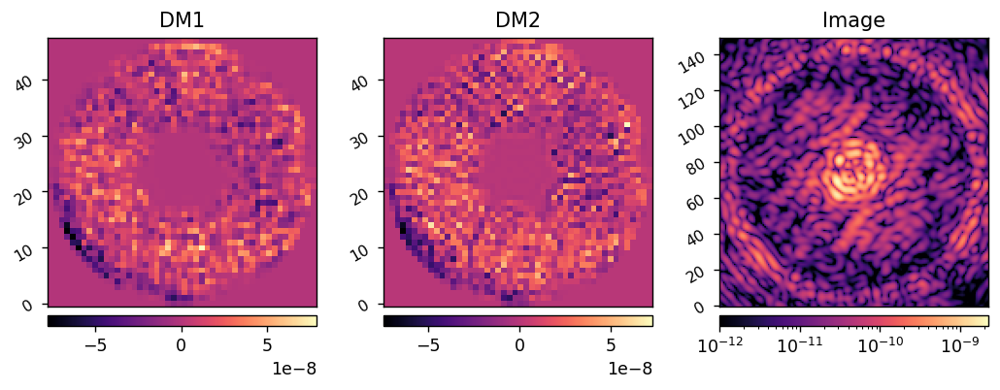

	Running iteration 36/40.


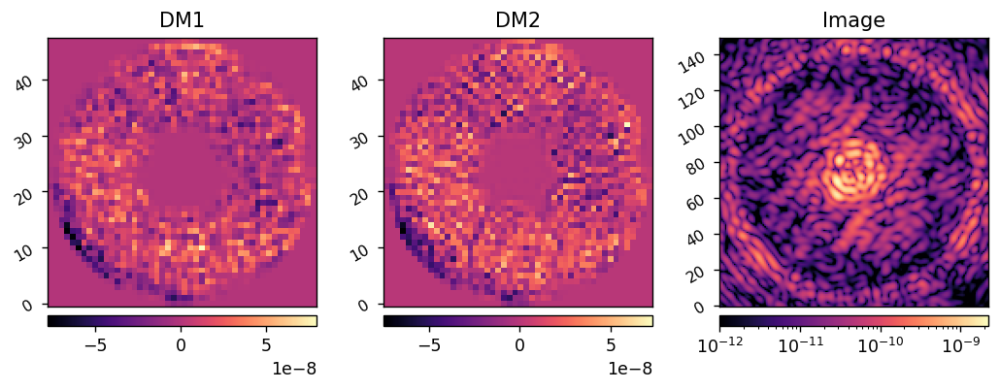

	Running iteration 37/40.


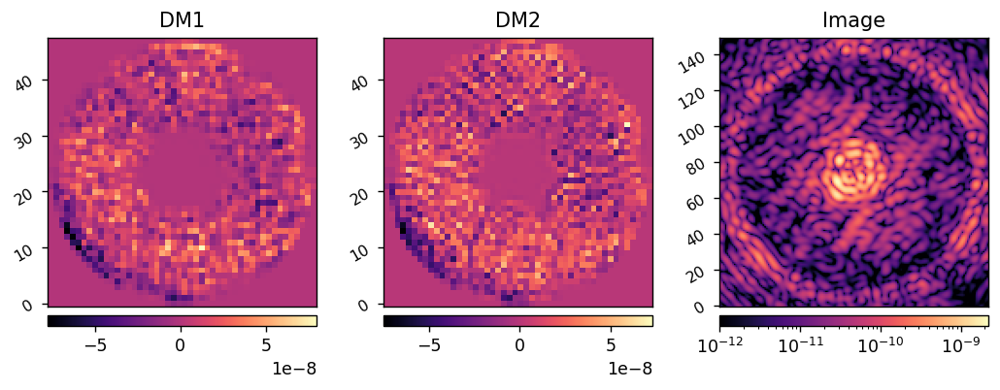

	Running iteration 38/40.


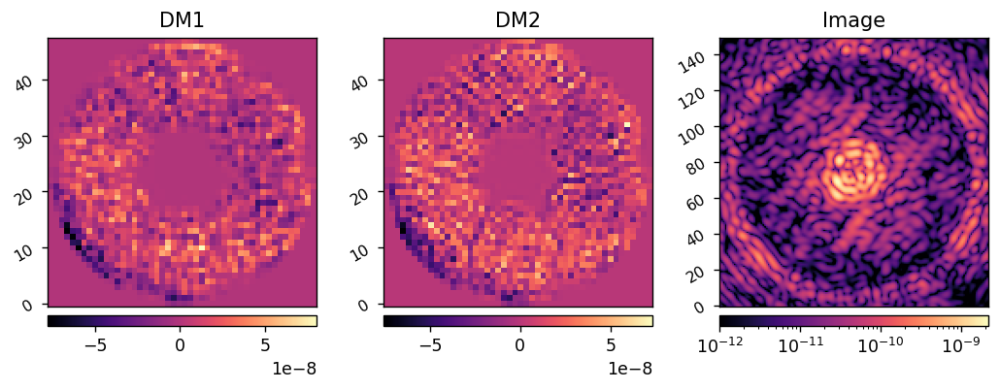

	Running iteration 39/40.


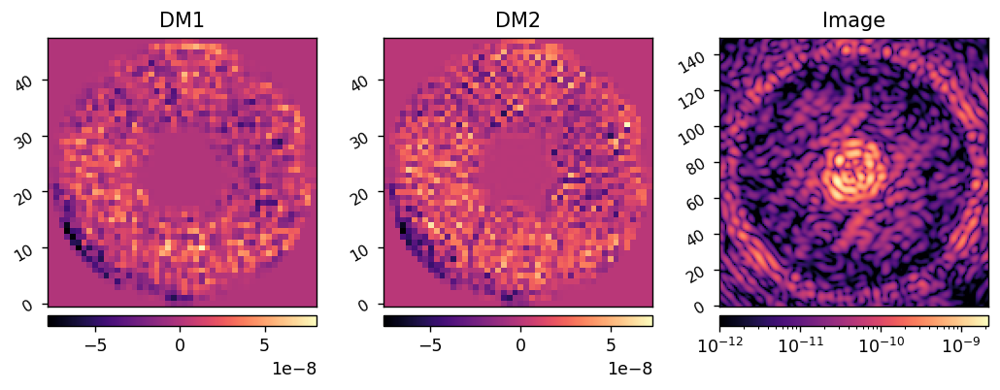

	Running iteration 40/40.


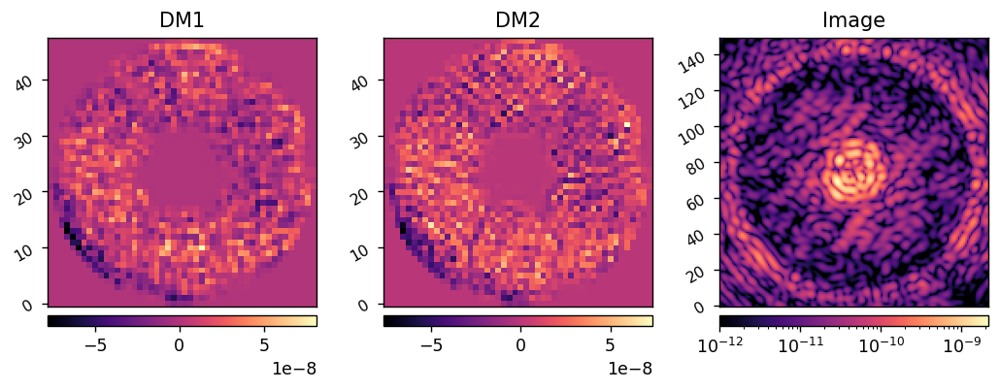

EFC completed in 38.605 sec.


In [28]:
reload(efc)
sys.reset_dms()
dm1_commands1, dm2_commands1, efields1 = efc.run_efc_perfect(sys, efc_matrix, dh_mask, iterations=40, display=True)

# Run EFC with PWP

In [39]:
reload(efc)
hlc.reset_dms()
commands2, efields2, images2 = efc.run_efc_pwp(sys, efc_matrix, jac, probes, dh_mask, iterations=10, display=False)

Beginning closed-loop EFC simulation.
	Running iteration 1/10.
	Running iteration 2/10.
	Running iteration 3/10.
	Running iteration 4/10.
	Running iteration 5/10.
	Running iteration 6/10.
	Running iteration 7/10.
	Running iteration 8/10.
	Running iteration 9/10.
	Running iteration 10/10.
EFC completed in 16.262 sec.
